In [1]:
import yfinance as yf
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
import numpy as np
from plotly.colors import sample_colorscale

def add_gradient_spread(fig, x, y, name, row, col=1, colorscale='IceFire'):
    """Add gradient-colored line segments based on y-values."""
    x = np.array(x)
    y = np.array(y)

    # Replace NaNs for color mapping but keep track for plotting
    y_for_color = np.nan_to_num(y, nan=0.0)
    max_val = np.nanmax(np.abs(y_for_color))
    if max_val == 0:
        max_val = 1

    for i in range(len(x) - 1):
        # Skip if either segment point is NaN
        if np.isnan(y[i]) or np.isnan(y[i + 1]):
            continue
        # Normalize value between 0 and 1
        val = (y_for_color[i] + max_val) / (2 * max_val)
        color = sample_colorscale(colorscale, val)[0]

        fig.add_trace(go.Scatter(
            x=[x[i], x[i + 1]],
            y=[y[i], y[i + 1]],
            mode='lines',
            line=dict(width=3, color=color),
            name=name if i == 0 else None,
            showlegend=(i == 0),
            hoverinfo='skip'
        ), row=row, col=col)

In [3]:
def add_hover_overlay(fig, x, y, name, row, col=1):
    fig.add_trace(go.Scatter(
        x=x,
        y=y,
        mode='lines',
        line=dict(width=0),
        hovertemplate="<b>Date:</b> %{x}<br>Spread: %{y:.2%}<extra></extra>",
        name=name + " (hover)",
        showlegend=False
    ), row=row, col=col)

In [4]:
#Download 10 years of data
tickers = ['XBI', 'VOO', 'PPH']
data = yf.download(tickers, period='10y', auto_adjust=True)['Close']

[*********************100%***********************]  3 of 3 completed


In [5]:
# 3. Calculate 3-month percentage changes
window = 365
pct_xbi = data['XBI'] / data['XBI'].shift(window) - 1
pct_voo = data['VOO'] / data['VOO'].shift(window) - 1
pct_pph = data['PPH'] / data['PPH'].shift(window) - 1

In [6]:
# 4. Calculate performance spread (XBI vs others)
spread_voo = pct_xbi - pct_voo
spread_pph = pct_xbi - pct_pph

In [7]:
# 5. Create figure with 5 rows (subplots)
fig = make_subplots(rows=5, cols=1, shared_xaxes=True,
                    row_heights=[0.2, 0.2, 0.2, 0.2, 0.2],
                    vertical_spacing=0.03,
                    subplot_titles=(
                        "XBI Price (Biotech)",
                        "VOO Price (S&P 500)",
                        "PPH Price (Pharma)",
                        "XBI vs VOO Outperformance Spread",
                        "XBI vs PPH Outperformance Spread"
                    ))

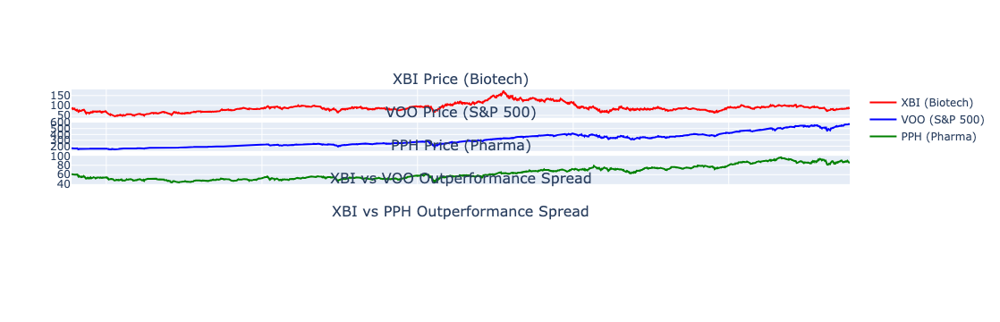

In [8]:
# --- Price Panels ---
fig.add_trace(go.Scatter(x=data.index, y=data['XBI'],
                         name='XBI (Biotech)', line=dict(width=2, color='red')),
              row=1, col=1)

fig.add_trace(go.Scatter(x=data.index, y=data['VOO'],
                         name='VOO (S&P 500)', line=dict(width=2, color='blue')),
              row=2, col=1)

fig.add_trace(go.Scatter(x=data.index, y=data['PPH'],
                         name='PPH (Pharma)', line=dict(width=2, color='green')),
              row=3, col=1)


In [9]:
add_gradient_spread(fig, data.index, spread_voo, "XBI - VOO Spread", 4)
add_hover_overlay(fig, data.index, spread_voo, "XBI - VOO Spread", 4)

add_gradient_spread(fig, data.index, spread_pph, "XBI - PPH Spread", 5)
add_hover_overlay(fig, data.index, spread_pph, "XBI - PPH Spread", 5)

In [10]:
# Invisible hover trace for XBI - VOO Spread
fig.add_trace(go.Scatter(
    x=data.index,
    y=spread_voo,
    mode='lines',
    line=dict(width=0),  # invisible line
    name="XBI - VOO Spread (hover)",
    hovertemplate="<b>Date:</b> %{x}<br>Spread: %{y:.2%}<extra></extra>"
), row=4, col=1)

# Invisible hover trace for XBI - PPH Spread
fig.add_trace(go.Scatter(
    x=data.index,
    y=spread_pph,
    mode='lines',
    line=dict(width=0),
    name="XBI - PPH Spread (hover)",
    hovertemplate="<b>Date:</b> %{x}<br>Spread: %{y:.2%}<extra></extra>"
), row=5, col=1)

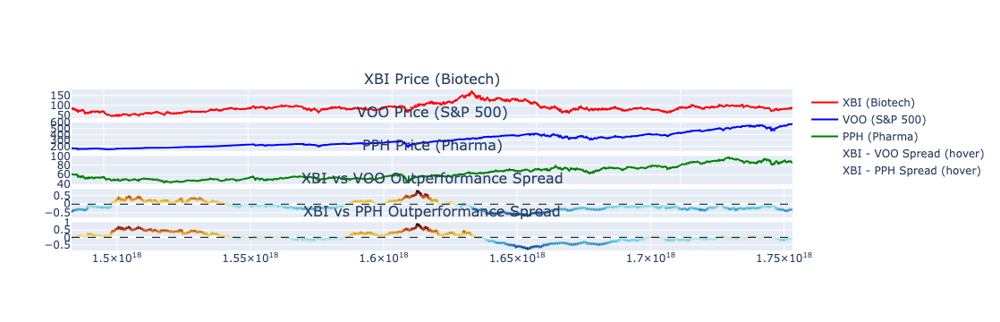

In [11]:
# Add reference lines for spreads
fig.add_hline(y=0, line=dict(color="black", width=1, dash="dash"), row=4, col=1)
fig.add_hline(y=0, line=dict(color="black", width=1, dash="dash"), row=5, col=1)

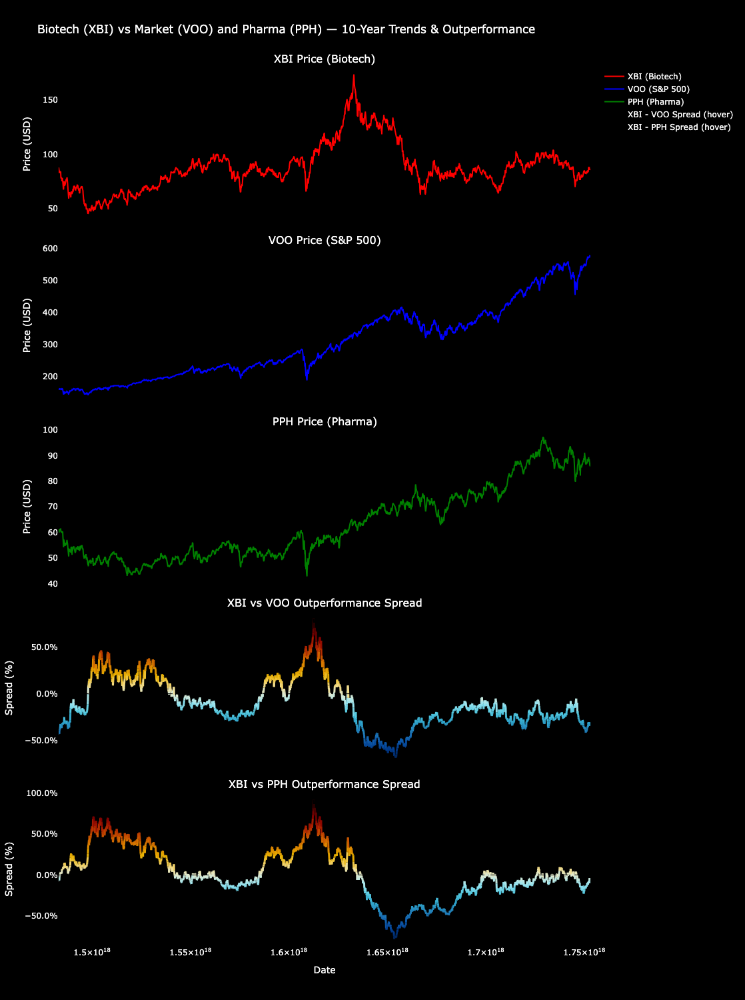

In [14]:
# --- Layout ---
fig.update_layout(
    title="Biotech (XBI) vs Market (VOO) and Pharma (PPH) — 10-Year Trends & Outperformance",
    hovermode="x unified",
    xaxis5_title="Date",
    yaxis1_title="Price (USD)",
    yaxis2_title="Price (USD)",
    yaxis3_title="Price (USD)",
    yaxis4_title="Spread (%)",
    yaxis5_title="Spread (%)",
    height=1500
)

# Format spread y-axes to show percentages
fig.update_yaxes(tickformat=".1%", row=4, col=1)
fig.update_yaxes(tickformat=".1%", row=5, col=1)

fig.update_layout(
    plot_bgcolor='black',   # Plot area background
    paper_bgcolor='black',  # Entire figure background
    font=dict(color='white'),  # Text color for contrast
)

# Remove gridlines from all subplots
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False)

fig.show()